# Исследование заведений общественного питания Москвы

**Цели исследования:**

Исследовать рынок общественного питания в Москве и предоставить рекомендации по выбору типа заведения, его расположения, меню и ценовой политики. Сделать анализ на основании данных сервисов Яндекс Карты и Яндекс Бизнес за лето 2022 года.
___
**Данные для анализа:**

Датасет `moscow_places.csv` со столбцами:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например:
    - «средние»;
    - «ниже среднего»;
    - «выше среднего» и так далее.
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽»  и так далее.

- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт».
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино».
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым:
    - 0 — заведение не является сетевым;
    - 1 — заведение является сетевым.
- `district` — административный район, в котором находится заведение.
- `seats` — количество посадочных мест.

___
**План работы:**
1. Загрузка и первичное знакомство с данными.
    - Загрузить данные из файла `/datasets/moscow_places.csv` в датафрейм;
    - Изучить общую информацию о данных.


2. Предобработка данных:
    - 2.1. Проверить данные на наличие дубликатов.
    - 2.2. Проверить данные на наличие пропусков.
    - 2.3. Добавить новые столбцы.


3. Исследовательский анализ данных:
- Исследовать:
    - 3.1. Категории заведений.
    - 3.2. Посадочные места по категориям.
    - 3.3. Сетевые и несетевые заведения.
    - 3.4. Категории сетевых заведений.
    - 3.5. Топ-15 популярных сетей.
    - 3.6. Количество заведений каждой категории по округам Москвы.
    - 3.7. Средние рейтинги по категориям.
    - 3.8. Медианные рейтинги заведений по округам Москвы.
    - 3.9. Кластерная карта заведений.
    - 3.10. Топ-15 улиц по количеству заведений.
    - 3.11. Улицы с одним заведением.
    - 3.12. Медианные цены заведений по округам Москвы.
    - 3.13. Медианные цены заведений по категориям.
    - 3.14. Заведения с низкими рейтингами.


4. Исследовательский анализ: открытие кофейни.
    - 4.1. Количество кофеен по округам Москвы.
    - 4.2. Круглосуточные кофейни  по округам Москвы.
    - 4.3. Рейтинги кофеен  по округам Москвы.
    - 4.4. Стоимость чашки капучино  по округам Москвы.
    - 4.5. Рекомендации для открытия нового заведения.
    

5. Презентация.


6. Выводы.

## Загрузка и знакомство с данными

**1.1. Импортируем все библиотеки, необходимые для анализа.**

In [5]:
# импорт библиотек для анализа данных
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

**1.2. Считываем данные из csv-файла и сохраняем в датафрейм moscow_places.**

In [7]:
try:
    moscow_places = pd.read_csv('/datasets/moscow_places.csv')
except:
    moscow_places = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

**1.3. Выведем первые и последние строки датафрейма.**

In [9]:
display(moscow_places)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


**1.4. Выведем основную информацию о датафрейме с помощью методов describe() и info().**

In [11]:
display(moscow_places.describe())
display(moscow_places.info())

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

**Выводы:** 
1. Датасет `moscow_places` содержит информацию о 8406 заведениях. 
2. У каждого заведения 14 характеристик (столбцов), которые представлены в виде разных типов данных:
    - Строковые данные (object):
        - `name`: название заведения
        - `category`: категория заведения
        - `address`: адрес заведения
        - `district`: район города
        - `hours`: время работы
        - `price`: ценовая категория
        - `avg_bill`: средний счет (в виде строки)
    - Вещественные числа (float64):
        - `lat`: широта (географические координаты)
        - `lng`: долгота (географические координаты)
        - `rating`: рейтинг заведения
        - `middle_avg_bill`: средний чек (в виде числа)
        - `middle_coffee_cup`: стоимость чашки кофе
        - `seats`: количество мест
    - Целые числа (int64):
        - `chain`: является ли заведение сетевым (0 — нет, 1 — да)

3. Большинство данных присутствуют, но есть пропуски в столбцах: `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, и `seats`.

## Предобработка данных

**2.1. Проверим данные на наличие дубликатов.**

In [15]:
# Проверим на наличие явных дубликатов
# Создаем копию датасета moscow_places
moscow_places_copy = moscow_places.copy()

# Применяем преобразование к каждому столбцу: приводим строки к нижнему регистру и удаляем пробелы в начале и конце строк,
# если тип столбца — строковый (object). Для остальных столбцов ничего не меняем.
moscow_places_copy = moscow_places_copy.apply(lambda col: col.str.lower().str.strip() if col.dtype == 'object' else col)
duplicates_after_cleaning = moscow_places_copy.duplicated().sum()

duplicates_after_cleaning

0

In [16]:
# Проверим на наличие неявных дубликатов по сабсету
moscow_places['name_clean'] = moscow_places['name'].str.lower().str.strip()
moscow_places['address_clean'] = moscow_places['address'].str.lower().str.strip()

implicit_duplicates = moscow_places.duplicated(subset=['name_clean', 'address_clean'])
implicit_duplicates_rows = moscow_places[moscow_places.duplicated(subset=['name_clean', 'address_clean'], keep=False)]

print("Количество неявных дубликатов: ", implicit_duplicates.sum())
implicit_duplicates_rows

Количество неявных дубликатов:  4


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_clean,address_clean
189,Кафе,кафе,"Москва, парк Ангарские Пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN,кафе,"москва, парк ангарские пруды"
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN,кафе,"москва, парк ангарские пруды"
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,more poke,"москва, волоколамское шоссе, 11, стр. 2"
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,more poke,"москва, волоколамское шоссе, 11, стр. 2"
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0,раковарня клешни и хвосты,"москва, проспект мира, 118"
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,раковарня клешни и хвосты,"москва, проспект мира, 118"
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0,хлеб да выпечка,"москва, ярцевская улица, 19"
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,хлеб да выпечка,"москва, ярцевская улица, 19"


In [17]:
# Удалим неявные дубликаты
moscow_places = moscow_places.drop_duplicates(subset=['name_clean', 'address_clean'])

# Проверим изменения
implicit_duplicates_after_cleaning = moscow_places.duplicated(subset=['name_clean', 'address_clean'])
print("Количество неявных дубликатов: ", implicit_duplicates_after_cleaning.sum())
print("Новый размер датасета 'moscow_places': ", moscow_places.shape)

Количество неявных дубликатов:  0
Новый размер датасета 'moscow_places':  (8402, 16)


In [18]:
coords_duplicates = moscow_places[moscow_places.duplicated(subset=['lat', 'lng'], keep=False)]
coords_duplicates

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_clean,address_clean
121,Встреча,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, круглосуточно",55.891936,37.536068,4.1,NaN,NaN,NaN,NaN,1,NaN,встреча,"москва, карельский бульвар, 4а"
182,Карелия,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, 09:00–00:00",55.891936,37.536068,3.7,NaN,NaN,NaN,NaN,0,NaN,карелия,"москва, карельский бульвар, 4а"
271,Алали,быстрое питание,"Москва, Староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.875804,37.665551,4.2,NaN,NaN,NaN,NaN,0,100.0,алали,"москва, староватутинский проезд, 14"
273,Pho Oanh,кафе,"Москва, Староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 11:00–21:30",55.875804,37.665551,4.0,NaN,NaN,NaN,NaN,1,100.0,pho oanh,"москва, староватутинский проезд, 14"
348,Meat Лав,ресторан,"Москва, Головинское шоссе, 10Б",Северный административный округ,"ежедневно, 11:00–23:00",55.837181,37.497324,5.0,средние,Средний счёт:300–600 ₽,450.0,NaN,0,NaN,meat лав,"москва, головинское шоссе, 10б"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7787,Тануки,ресторан,"Москва, Липецкая улица, 2, корп. 8",Южный административный округ,"ежедневно, 10:00–05:00",55.608307,37.664941,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,1,120.0,тануки,"москва, липецкая улица, 2, корп. 8"
8019,Пицца Кофе,пиццерия,"Москва, улица Вавилова, 66",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.683046,37.549310,4.2,NaN,NaN,NaN,NaN,0,80.0,пицца кофе,"москва, улица вавилова, 66"
8086,Кулинарная школа Ginza Project,кафе,"Москва, Мытная улица, 74",Южный административный округ,"ежедневно, 09:00–21:00",55.712117,37.620555,4.5,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,92.0,кулинарная школа ginza project,"москва, мытная улица, 74"
8095,Белочка,ресторан,"Москва, улица Ленинская Слобода, 19",Южный административный округ,пн-пт 12:00–17:00,55.708354,37.652705,3.4,NaN,NaN,NaN,NaN,0,450.0,белочка,"москва, улица ленинская слобода, 19"


**2.2. Проверим данные на наличие пропусков.**

In [20]:
# Проверим на наличие пропусков
missing_values_count = moscow_places.isna().sum()
missing_values_share = round(moscow_places.isna().mean() * 100, 2)

missing_data = pd.DataFrame({'missing_values_count': missing_values_count, 'missing_values_share': missing_values_share}).sort_values(by='missing_values_count', ascending=False)

missing_data

,missing_values_count,missing_values_share
middle_coffee_cup,7867,93.63
middle_avg_bill,5253,62.52
price,5087,60.55
avg_bill,4586,54.58
seats,3610,42.97
hours,535,6.37
name,0,0.00
category,0,0.00
address,0,0.00
district,0,0.00


1. `middle_coffee_cup` (93.63% пропусков)

- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино».
- Проверим есть ли строки, где `avg_bill` начинается с подстроки 'Цена чашки капучино', а в `middle_coffee_cup` пропуски.
- Если таких строк нет, то оставим как есть.

In [22]:
# Фильтруем строки, где 'avg_bill' начинается с 'Цена чашки капучино'
filtered_coffee_rows = moscow_places[
    (moscow_places['avg_bill'].str.startswith('Цена чашки капучино', na=False)) 
]

# Выводим результат
print("Количество, строк, где 'avg_bill' начинается с 'Цена чашки капучино':", len(filtered_coffee_rows))

# Фильтруем строки, где 'avg_bill' начинается с 'Цена чашки капучино', а в 'middle_coffee_cup' пропуски
filtered_coffee_na_rows = moscow_places[
    (moscow_places['avg_bill'].str.startswith('Цена чашки капучино', na=False)) &
    (moscow_places['middle_coffee_cup'].isna())
]

# Выводим результат
print("Количество, строк, где 'avg_bill' начинается с 'Цена чашки капучино', а в 'middle_coffee_cup' пропуски:", len(filtered_coffee_na_rows))

Количество, строк, где 'avg_bill' начинается с 'Цена чашки капучино': 535
Количество, строк, где 'avg_bill' начинается с 'Цена чашки капучино', а в 'middle_coffee_cup' пропуски: 0


Заменяем пропуски в `middle_coffee_cup` на np.nan, обозначая, что данные отсуствуют.

In [24]:
# Заменяем пропуски в столбцах 'middle_coffee_cup' на np.nan
moscow_places['middle_coffee_cup'] = moscow_places['middle_coffee_cup'].fillna(np.nan)

2. `middle_avg_bill` (62.52% пропусков)

- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки 'Средний счёт'.
- Проверим есть ли строки, где `avg_bill` начинается с подстроки 'Средний счёт', а в `middle_coffee_cup` пропуски.
- Если таких строк нет, то оставим как есть.

In [26]:
# Фильтруем строки, где 'avg_bill' начинается с 'Средний счёт'
filtered_bill_rows = moscow_places[
    (moscow_places['avg_bill'].str.startswith('Средний счёт', na=False)) 
]

# Выводим результат
print("Количество, строк, где 'avg_bill' начинается с 'Средний счёт':", len(filtered_bill_rows))

# Фильтруем строки, где 'avg_bill' начинается с 'Средний счёт', а в 'middle_avg_bill' пропуски
filtered_bill_na_rows = moscow_places[
    (moscow_places['avg_bill'].str.startswith('Средний счёт', na=False)) &
    (moscow_places['middle_avg_bill'].isna())
]

# Выводим результат
print("Количество, строк, где 'avg_bill' начинается с 'Средний счёт', а в 'middle_avg_bill' пропуски:", len(filtered_bill_na_rows))

Количество, строк, где 'avg_bill' начинается с 'Средний счёт': 3149
Количество, строк, где 'avg_bill' начинается с 'Средний счёт', а в 'middle_avg_bill' пропуски: 0


Заменяем пропуски в `middle_avg_bill` на np.nan, обозначая, что данные отсуствуют.

In [28]:
# Заменяем пропуски в столбце 'middle_avg_bill' на np.nan
moscow_places['middle_avg_bill'] = moscow_places['middle_avg_bill'].fillna(np.nan)

3. `price` (60.55% пропусков)
- Заполним пропуски медианными значениями `middle_avg_bill` для каждой категории.

In [30]:
# Посмотрим какие есть ценовые категории
moscow_places['price'].value_counts()

price
средние          2117
выше среднего     564
высокие           478
низкие            156
Name: count, dtype: int64

In [31]:
# Группируем по категории и вычисляем минимум, медиану и максимум для среднего чека
category_median_bill = moscow_places.groupby('category').agg(
    min_bill=('middle_avg_bill', 'min'),
    median_bill=('middle_avg_bill', 'median'),
    max_bill=('middle_avg_bill', 'max')
).sort_values(by='median_bill', ascending=False)

print(category_median_bill)
type(category_median_bill)

                 min_bill  median_bill  max_bill
category                                        
бар,паб             150.0       1250.0   11000.0
ресторан            120.0       1250.0   35000.0
пиццерия            150.0        600.0    3000.0
кафе                 67.0        550.0    4500.0
булочная             50.0        450.0    2500.0
кофейня               0.0        400.0    2500.0
быстрое питание      30.0        375.0    5500.0
столовая            125.0        300.0    3750.0


pandas.core.frame.DataFrame

In [32]:
# Группируем по цене и вычисляем минимум, медиану и максимум для среднего чека
price_median_bill = moscow_places.groupby('price').agg(
    min_bill=('middle_avg_bill', 'min'),
    median_bill=('middle_avg_bill', 'median'),
    max_bill=('middle_avg_bill', 'max')
).sort_values(by='median_bill', ascending=False)

price_median_bill

,min_bill,median_bill,max_bill
price,,,
высокие,0.0,2000.0,35000.0
выше среднего,375.0,1250.0,4500.0
средние,165.0,500.0,2150.0
низкие,90.0,180.0,600.0


Явно присутствуют выбросы, поэтому медиана лучше отражает реалистичные цены в каждой категории.

In [34]:
# Извлекаем столбец 'median_bill' для удобного доступа к медианным значениям по категориям
median_price_by_category = category_median_bill['median_bill']

# Напишем функцию для определения ценовой категории на основе медианы среднего чека
def get_price_from_median_bill(median_bill):
    if median_bill <= 400:
        return 'низкие'
    elif 400 < median_bill <= 1000:
        return 'средние'
    elif 1000 < median_bill <= 1500:
        return 'выше среднего'
    else:
        return 'высокие'

# Функция для заполнения пропусков в 'price' на основе категории заведения и медианного чека
def fill_price_based_on_category(row):
    if pd.isna(row['price']):
        median_bill = median_price_by_category.get(row['category'], None)
        if median_bill is not None:
            return get_price_from_median_bill(median_bill)
    return row['price']

# Применим функцию для заполнения пропусков в 'price'
moscow_places['price'] = moscow_places.apply(fill_price_based_on_category, axis=1)

# Проверим есть ли пропуски
missing_price_rows = moscow_places[moscow_places['price'].isna()]
print("Количество пропусков с столбце 'price'", len(missing_price_rows))

# Проверим изменения
moscow_places[['category', 'price']].head()

Количество пропусков с столбце 'price' 0


,category,price
0,кафе,средние
1,ресторан,выше среднего
2,кафе,средние
3,кофейня,низкие
4,пиццерия,средние


4. Пропуски в столбцах `avg_bill` (54.58% пропусков), `seats` (42.97% пропусков), `hours` (6.38% пропусков).
- Не будем гадать, чтобы не исказить распределение данных. Пропуски заполним дефолтными значениями.

In [36]:
# Заполняем пропуски в столбцах 'avg_bill', 'seats' и 'hours'.
# Для 'avg_bill' и 'hours' используем строку "не указано",
# а для 'seats' - np.nan, чтобы указать на отсутствие данных
moscow_places['avg_bill'] = moscow_places['avg_bill'].fillna("не указано")
moscow_places['seats'] = moscow_places['seats'].fillna(np.nan)
moscow_places['hours'] = moscow_places['hours'].fillna("не указано")

# Проверим изменения
moscow_places[['category', 'avg_bill', 'seats', 'hours']].head()

,category,avg_bill,seats,hours
0,кафе,не указано,NaN,"ежедневно, 10:00–22:00"
1,ресторан,Средний счёт:1500–1600 ₽,4.0,"ежедневно, 10:00–22:00"
2,кафе,Средний счёт:от 1000 ₽,45.0,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00..."
3,кофейня,Цена чашки капучино:155–185 ₽,NaN,"ежедневно, 09:00–22:00"
4,пиццерия,Средний счёт:400–600 ₽,148.0,"ежедневно, 10:00–22:00"


**2.3. Добавим новые столбцы.**
1. столбец street с названиями улиц из столбца с адресом.
2. столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    - True — если заведение работает ежедневно и круглосуточно;
    - False — в противоположном случае.

In [38]:
# Создаем столбец 'street' с названиями улиц, извлекая их из адреса
moscow_places['street'] = moscow_places['address'].apply(lambda x: x.split(", ")[1] if len(x.split(", ")) > 2 else None)

# Создаем столбец 'is_24_7', обозначающий круглосуточный и ежедневный режим работы
moscow_places['is_24_7'] = moscow_places['hours'].apply(lambda x: True if 'круглосуточно' in str(x).lower() and 'ежедневно' in str(x).lower() else False)

# Проверим изменения
moscow_places[['address', 'street', 'hours', 'is_24_7']]

,address,street,hours,is_24_7
0,"Москва, улица Дыбенко, 7/1",улица Дыбенко,"ежедневно, 10:00–22:00",False
1,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко,"ежедневно, 10:00–22:00",False
2,"Москва, Клязьминская улица, 15",Клязьминская улица,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"Москва, улица Маршала Федоренко, 12",улица Маршала Федоренко,"ежедневно, 09:00–22:00",False
4,"Москва, Правобережная улица, 1Б",Правобережная улица,"ежедневно, 10:00–22:00",False
...,...,...,...,...
8401,"Москва, Профсоюзная улица, 56",Профсоюзная улица,"ежедневно, 09:00–02:00",False
8402,"Москва, Пролетарский проспект, 19, корп. 1",Пролетарский проспект,"ежедневно, 08:00–22:00",False
8403,"Москва, Люблинская улица, 112А, стр. 1",Люблинская улица,"ежедневно, круглосуточно",True
8404,"Москва, Люблинская улица, 112А, стр. 1",Люблинская улица,"ежедневно, круглосуточно",True


**Выводы:** 
1. Обработка дубликатов:
    - явных дубликатов: нет;
    - неявных дубликатов: обнаружены и удалены 4 строки.
Новый размер датасета 'moscow_places': (8402, 16). 


2. Обработка пропусков:
    - `middle_coffee_cup` (93.64% пропусков) и `middle_av_bill` (62.54% пропусков) - все ок, значения зависят от столбца `avg_bill` и отсутствуют только там, где их не должно быть по смыслу.
    - `price` (60.56% пропусков) - заполнила пропуски медианными значениями `middle_av_bill` для каждой категории заведений.
    - `avg_bill` (54.58% пропусков), `seats` (42.97% пропусков), `hours` (6.38% пропусков) - заполнила пропуски заглушками: для `avg_bill` и `hours` строкой "не указано", для `seats` - np.nan.
 
 
3. Добавление новых столбцов для более полного анализа:
- столбец street с названиями улиц из столбца с адресом.
- столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    - True — если заведение работает ежедневно и круглосуточно;
    - False — в противоположном случае.

## Исследовательский анализ данных

**3.1. Категории заведений.**

Количество заведений по категориям:


,category,count,share
0,кафе,2376,28.28
1,ресторан,2042,24.30
2,кофейня,1413,16.82
3,"бар,паб",764,9.09
4,пиццерия,633,7.53
5,быстрое питание,603,7.18
6,столовая,315,3.75
7,булочная,256,3.05


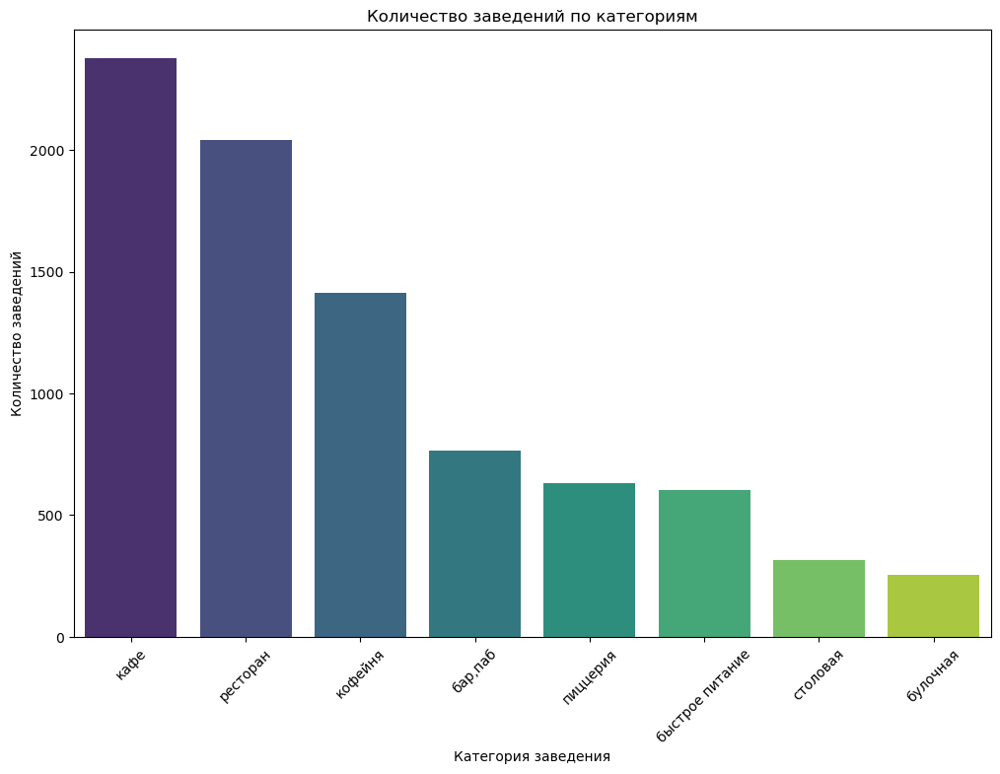

In [42]:
# Подсчитаем количество объектов по категориям
category_info = moscow_places['category'].value_counts().reset_index(name='count').rename(columns={'index': 'category'})
category_info['share'] = (category_info['count'] / category_info['count'].sum() * 100).round(2)

# Выводим результат
print('Количество заведений по категориям:')
display(category_info)

# Строим график распределения заведений по категориям
plt.figure(figsize=(12, 8))
sns.barplot(data=category_info, x='category', y='count', palette="viridis", hue='category')

plt.title('Количество заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')

plt.xticks(rotation=45)
plt.show()

Выводы:
- Кафе (28.29%) и рестораны (24.30%) являются самыми распространенными категориями заведений.
- Кофейни занимают третье место, составляя 16.81% заведений.
- Бары и пабы составляют - 9.10% от общего числа заведений, пиццерии - 7.53% и быстрое питание - 7.17%.
- Столовые (3.75%) и булочные (3.05%) - наименее популярные категории заведений.

**3.2. Количество посадочных мест по категориям.**

Медианное количество посадочных мест по категориям:


category
ресторан           86.0
бар,паб            82.0
кофейня            80.0
столовая           75.5
быстрое питание    65.0
кафе               60.0
пиццерия           55.0
булочная           50.0
Name: seats, dtype: float64

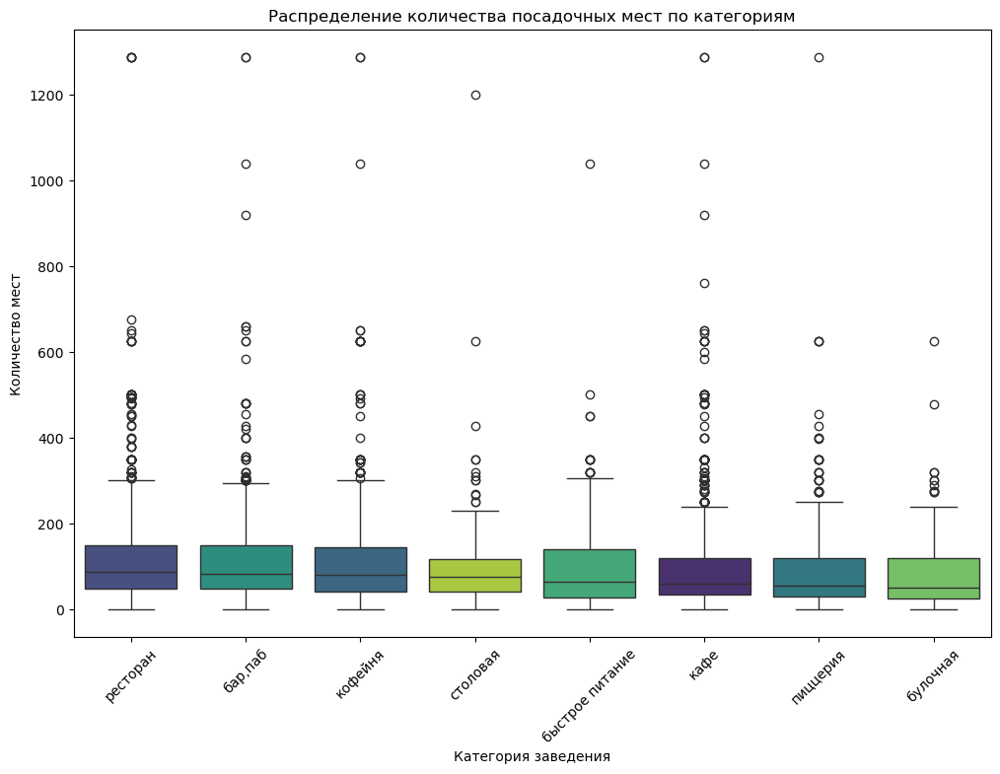

In [45]:
# Рассчитаем медиану количества посадочных мест по категориям
sorted_categories = moscow_places.groupby('category')['seats'].median().sort_values(ascending=False)

# Выводим результат
print('Медианное количество посадочных мест по категориям:')
display(sorted_categories)

# Построим диаграмму размаха (boxplot) для количества мест, следуя отсортированному порядку категорий
plt.figure(figsize=(12, 8))
sns.boxplot(data=moscow_places, x='category', y='seats', order=sorted_categories.index, palette="viridis", hue='category')

plt.title('Распределение количества посадочных мест по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество мест')

plt.xticks(rotation=45)
plt.show()

Увеличим масштаб.

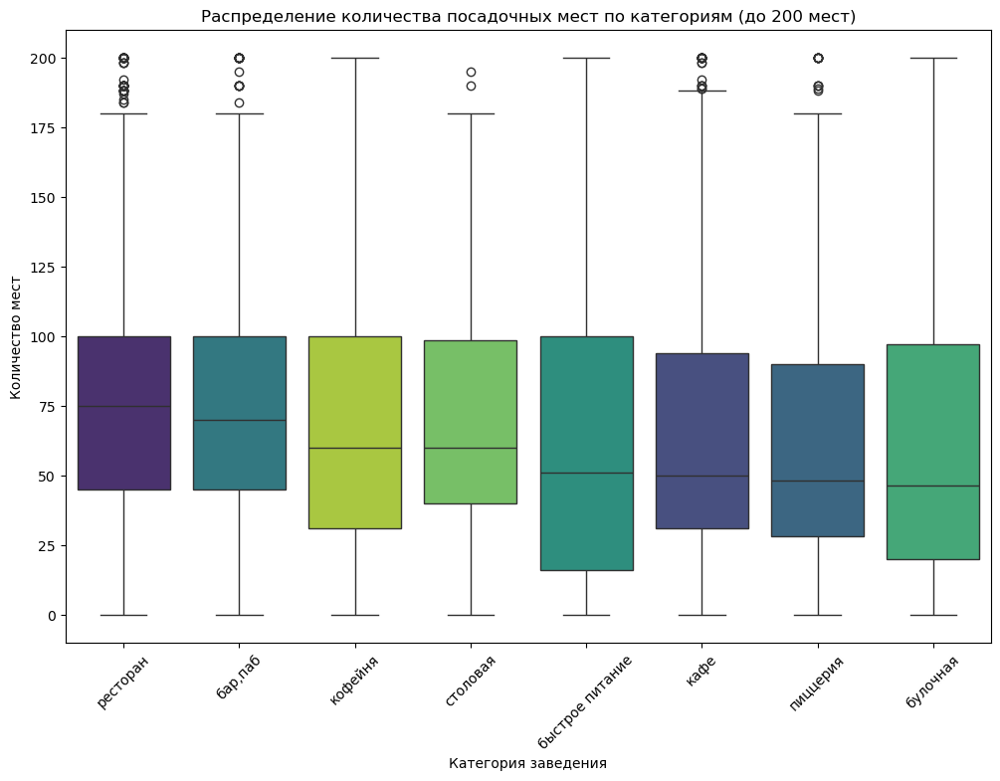

In [47]:
# Построим диаграмму размаха, ограничив количество мест до 200 мест
plt.figure(figsize=(12, 8))
sns.boxplot(data=moscow_places[moscow_places['seats'] <= 200], x='category', y='seats', order=sorted_categories.index, palette='viridis', hue='category')

plt.title('Распределение количества посадочных мест по категориям (до 200 мест)')
plt.xlabel('Категория заведения')
plt.ylabel('Количество мест')

plt.xticks(rotation=45)
plt.show()

Выводы:
- Рестораны, бары/пабы и кофейни имеют больше посадочных мест, чем остальные заведения. При этом наименьший разброс в количестве посадочных мест.
- Столовые, заведения быстрого питания, кафе имеют среднюю вместимость.
- Пиццерии и булочные имеют наименьшую вместимость.

**3.3. Сетевые и несетевые заведения.**

Соотношение сетевых и несетевых заведений:


,chain,count,share
0,0,5199,61.88
1,1,3203,38.12


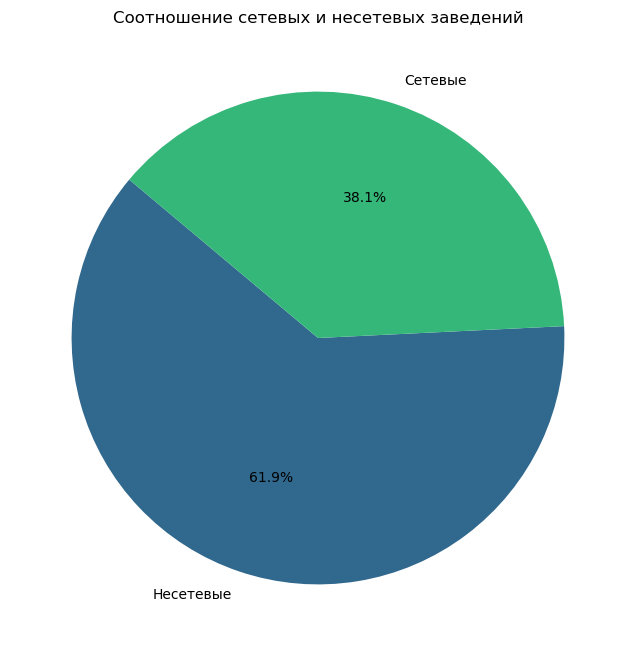

In [50]:
# Подсчитаем количество сетевых и несетевых заведений
chain_info = moscow_places['chain'].value_counts().reset_index(name='count').rename(columns={'index': 'chain'})
chain_info['share'] = (chain_info['count'] / chain_info['count'].sum() * 100).round(2)

# Выводим результат
print('Соотношение сетевых и несетевых заведений:')
display(chain_info)

# Соотношение сетевых и несетевых заведений
plt.figure(figsize=(12, 8))
colors = sns.color_palette("viridis", 2)
plt.pie(chain_info['count'], labels=['Несетевые', 'Сетевые'], autopct='%1.1f%%', startangle=140, colors=colors)

plt.title('Соотношение сетевых и несетевых заведений')

plt.show()

Выводы:
- Несетевые заведения составляют большинство 61.88% от общего количества заведений.
- Сетевые заведения составляют - 38.1%.

**3.4. Категории сетевых заведений.**

Доля сетевых заведений по категориям:


,category,non_chain,chain,total,chain_share
1,булочная,99,157,256,61.33
5,пиццерия,303,330,633,52.13
4,кофейня,693,720,1413,50.96
2,быстрое питание,371,232,603,38.47
6,ресторан,1313,729,2042,35.70
3,кафе,1597,779,2376,32.79
7,столовая,227,88,315,27.94
0,"бар,паб",596,168,764,21.99


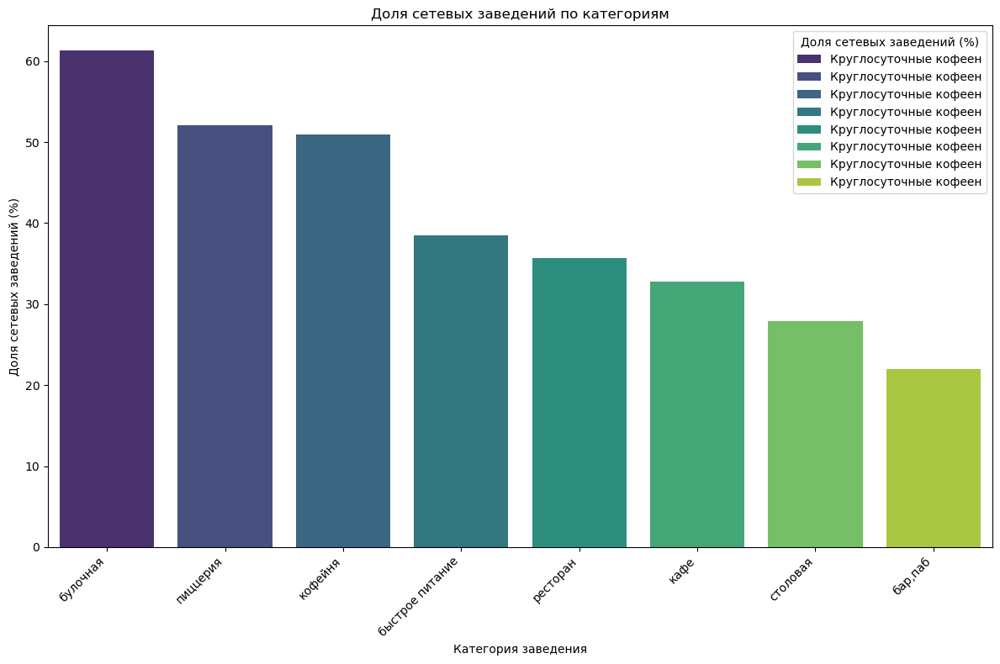

In [53]:
# Посмотрим какие категории заведений чаще являются сетевыми
chain_category_info = moscow_places.groupby(['category', 'chain']).size().unstack(fill_value=0)
chain_category_info.columns = ['non_chain', 'chain']
chain_category_info['total'] = chain_category_info.sum(axis=1)
chain_category_info['chain_share'] = (chain_category_info['chain'] / chain_category_info['total'] *100).round(2)
chain_category_info = chain_category_info.reset_index().sort_values(by='chain_share', ascending=False)

print('Доля сетевых заведений по категориям:')
display(chain_category_info)

# Строим график
plt.figure(figsize=(12, 8))
sns.barplot(data=chain_category_info, x='category', y='chain_share', palette='viridis', hue='category', label='Круглосуточные кофеен')

plt.title('Доля сетевых заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Доля сетевых заведений (%)')

plt.xticks(rotation=45, ha='right')
plt.legend(title='Доля сетевых заведений (%)', loc='upper right')

plt.tight_layout()
plt.show()

Выводы:
- Сетевыми заведениями чаще являются булочные (61.33% от общего числа булочных), пиццерии (52.13% от общего числа пиццерий) и кофейни (50.96% от общего числа кофеен).

**3.5. Топ-15 популярных сетей по количеству заведений.**

Топ-15 популярных сетей по количеству заведений:


,name,category,count
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


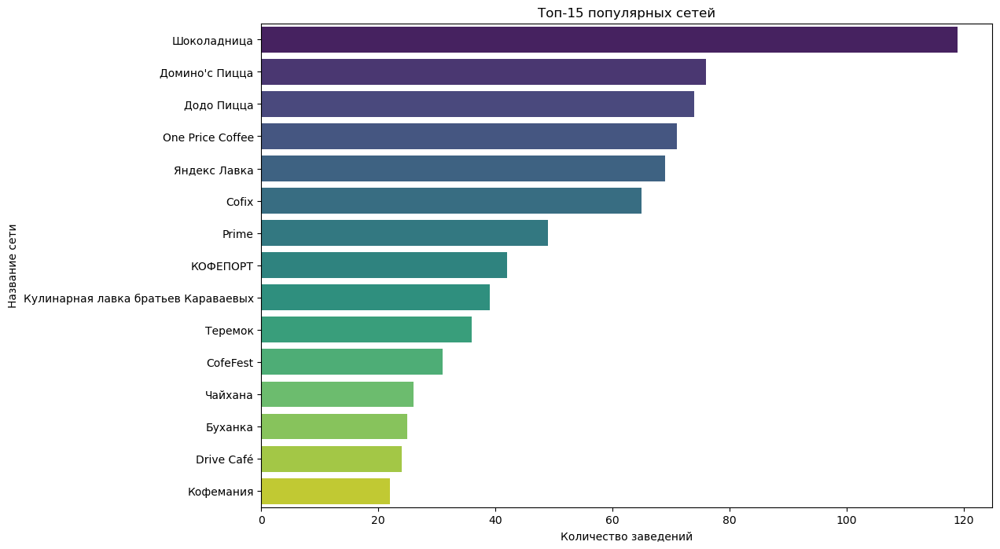

In [56]:
# Группируем по названию и считаем количество заведений каждой сети
top_chains = moscow_places[moscow_places['chain'] == 1].groupby(['name', 'category']).size().sort_values(ascending=False).head(15).reset_index()
top_chains.columns = ['name', 'category', 'count']

# Выводим результат
print('Топ-15 популярных сетей по количеству заведений:')
display(top_chains)

# Строим график распределения топ-15 сетей
plt.figure(figsize=(12, 8))
sns.barplot(data=top_chains, x='count', y='name', palette="viridis", hue='name')

plt.title('Топ-15 популярных сетей')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети')

plt.show()

Выводы:
- Наиболее крупная сеть: "Шоколадница" со 120 заведениями. Она выделяется в списке сетей с заметным отрывом.
- Форматы популярных заведений:
    - Кофейни: Шоколадница (119), One Price Coffee (71), Cofix (65), КОФЕПОРТ (42), CofeFest (31), и Кофемания (22).
    - Пиццерии: Домино'с Пицца (76) и Додо Пицца (74).
    - Рестораны быстрого обслуживания: Яндекс Лавка (69), Prime (49), и Теремок (36). Это указывает на высокий интерес к заведениям быстрого обслуживания, плюс если есть доставка.
    - Кафе: Кулинарная лавка братьев Караваевых (39), Чайхана (26), и Drive Café (24).


Категории заведений преимущественно охватывают кофейни, пиццерии, рестораны быстрого обслуживания, кафе, что показывает о высокой востребованности таких форматов. 

**3.6. Количество заведений каждой категории по округам Москвы.**

Количество заведений каждой категории по округам:


category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,всего
district,,,,,,,,,
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Северный административный округ,68,39,58,234,193,77,188,41,898
Южный административный округ,68,25,85,264,131,73,202,44,892
Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
Западный административный округ,50,37,62,238,150,71,218,24,850
Восточный административный округ,53,25,71,272,105,72,160,40,798
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


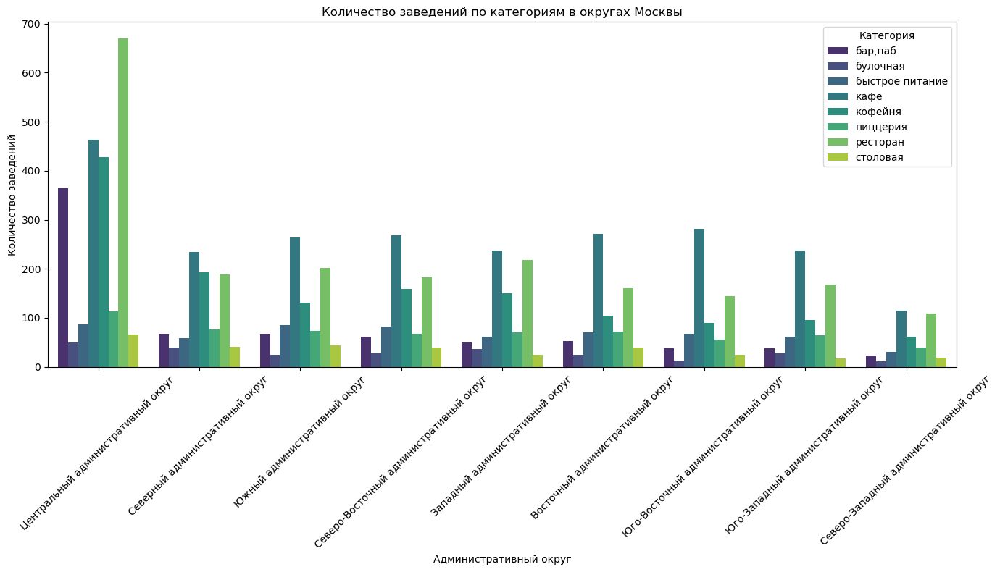

In [59]:
# Группируем данные по округу и категории
district_category_info = moscow_places.groupby(['district', 'category']).size().unstack(fill_value=0)
district_category_info['всего'] = district_category_info.sum(axis=1)
district_category_info = district_category_info.sort_values(by='всего', ascending=False)

# Выводим результат
print('Количество заведений каждой категории по округам:')
display(district_category_info)

# Строим график распределения количества заведений каждой категории по округам Москвы
plt.figure(figsize=(14, 8))

district_category_info_long = district_category_info.drop(columns='всего').reset_index().melt(id_vars='district', var_name='category', value_name='Количество')
sns.barplot(data=district_category_info_long, x='district', y='Количество', hue='category', palette='viridis')

plt.title('Количество заведений по категориям в округах Москвы')
plt.xlabel('Административный округ')
plt.ylabel('Количество заведений')

plt.xticks(rotation=45)
plt.legend(title='Категория')

plt.tight_layout()
plt.show()

Выводы:
- Центральный округ лидирует по общему количеству заведений, а также по количеству ресторанов, кафе, кофеен и пабов/баров. Значительная часть ресторанов и пабов/баров сконцентрирована в центре.
- В остальных округах популярны кафе, кофейни и рестораны, но в меньших количествах по сравнению с Центральным округом.

**3.7. Средние рейтинги по категориям заведений.**

Средние рейтинги по категориям заведений:


,avg_rating
category,
"бар,паб",4.4
пиццерия,4.3
ресторан,4.3
кофейня,4.3
булочная,4.3
столовая,4.2
кафе,4.1
быстрое питание,4.1


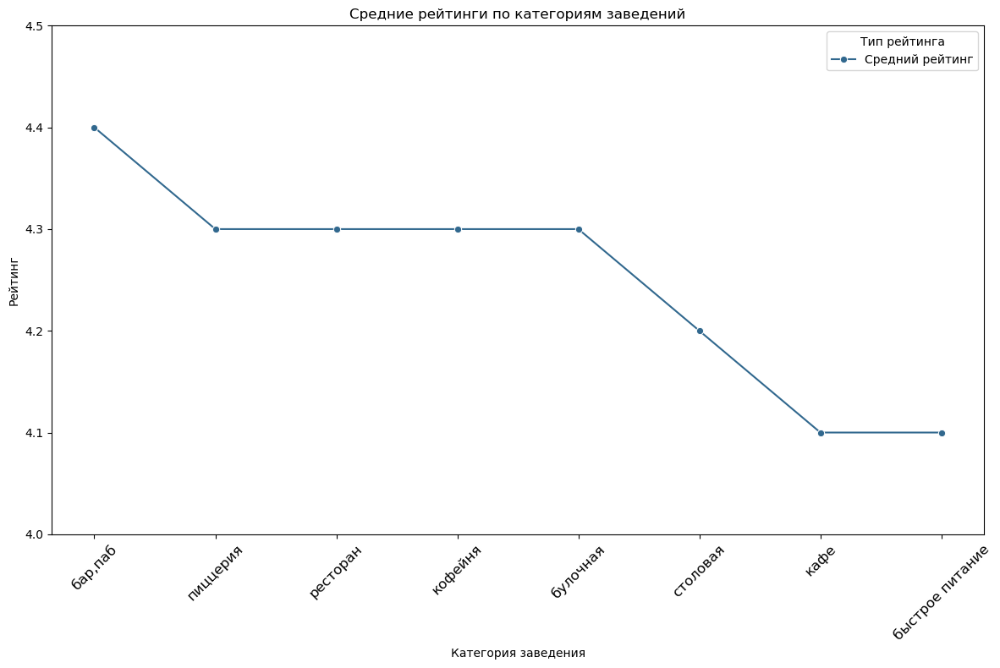

In [62]:
# Подсчитаем средний рейтинг по категориям
avg_median_rating_by_category = moscow_places.groupby('category').agg(avg_rating=('rating', 'mean')).sort_values(by='avg_rating', ascending=False)
avg_median_rating_by_category['avg_rating'] = avg_median_rating_by_category['avg_rating'].round(1)

# Выводим результат
print('Средние рейтинги по категориям заведений:')
display(avg_median_rating_by_category)

# Строим линейные графики средних рейтингов по категориям заведениям
plt.figure(figsize=(12, 8))
sns.lineplot(data=avg_median_rating_by_category, x=avg_median_rating_by_category.index, y='avg_rating', marker='o', label='Средний рейтинг', color=sns.color_palette("viridis", 2)[0])

plt.title('Средние рейтинги по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Рейтинг')
plt.ylim(4.0, 4.5)  # Диапазон для лучшей детализации

plt.xticks(rotation=45, fontsize=12)
plt.legend(title='Тип рейтинга')

plt.tight_layout()
plt.show()

Выводы:
- У пабов и баров самый высокий рейтинг - 4.4.
- У булочных, кофеен, пиццерий и ресторанов - рейтинг 4.3. 
- У столовых - рейтинг 4.2.
- У кафе и кафе быстрого питания самый низкий рейтинг - 4.1. 

**3.8. Средние рейтинги заведений по округам Москвы.**

In [65]:
district_rating_info = moscow_places.groupby('district')['rating'].agg(['min', 'mean', 'median', 'max', 'count']).sort_values(by='median', ascending=False).reset_index()
district_rating_info['mean'] = district_rating_info['mean'].round(2)

# Выводим результат
print('Средние рейтинги заведений по округам Москвы:')
display(district_rating_info.sort_values(by='mean', ascending=False))

Средние рейтинги заведений по округам Москвы:


,district,min,mean,median,max,count
0,Центральный административный округ,1.7,4.38,4.4,5.0,2242
3,Северный административный округ,1.3,4.24,4.3,5.0,898
4,Северо-Западный административный округ,1.1,4.21,4.3,5.0,409
2,Западный административный округ,1.0,4.18,4.3,5.0,850
6,Южный административный округ,1.1,4.18,4.3,5.0,892
1,Восточный административный округ,1.2,4.17,4.3,5.0,798
5,Юго-Западный административный округ,1.0,4.17,4.3,5.0,709
7,Северо-Восточный административный округ,1.0,4.15,4.2,5.0,890
8,Юго-Восточный административный округ,1.0,4.10,4.2,5.0,714


In [66]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('geo.json', 'r') as f:
    geo_json = json.load(f)

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
folium.Choropleth(
    geo_data=geo_json,
    data=district_rating_info,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средние рейтинги по округам Москвы',
).add_to(m)

# Выводим карту
m

Выводы:
- Центральный округ имеет самый высокий средний рейтинг (4.38).
- Северный (4.24) и Северо-Западный административные округа (4.21) также показывают хорошие средние рейтинги.
- Юго-Восточный округ имеет самый низкий средний рейтинг (4.10).
- У остальных округов средний рейтинг колеблется от 4.15 до 4.18.

**3.9. Кластерная карта заведений.**

Отобразим распределение заведений по округам Москвы.

In [70]:
# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
folium.Choropleth(
    geo_data=geo_json,
    data=district_rating_info,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средние рейтинги по округам Москвы',
).add_to(m)

# Выводим карту
m

Отобразим все заведения датасета на карте с помощью кластеров.

In [72]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    # создаём маркер с иконкой icon и добавляем его в кластер
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)

# Применяем функцию для создания кластеров к каждой строке датафрейма
moscow_places.apply(create_clusters, axis=1)

# Выводим карту
m

**3.10. Топ-15 улиц по количеству заведений.**

Найдем топ-15 улиц по количеству заведений. Построим тепловую карту заведений по категориям на топ-15 улицах.

Топ-15 улиц по количеству заведений:


,street,count
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,75
8,Ленинградское шоссе,69
9,МКАД,65



Количество заведений по категориям на топ-15 улицах:


category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Варшавское шоссе,6.0,0.0,7.0,17.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,25.0,3.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Люблинская улица,5.0,0.0,5.0,26.0,11.0,1.0,10.0,2.0
МКАД,1.0,0.0,9.0,45.0,4.0,0.0,5.0,1.0


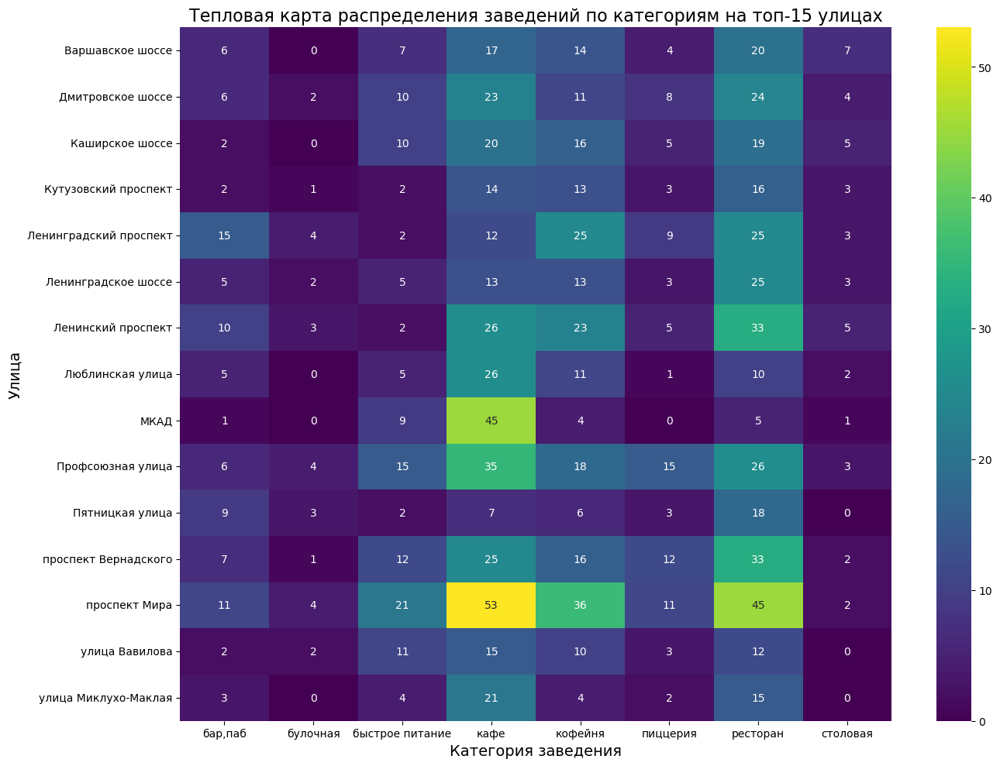

In [75]:
# Подсчитываем топ-15 улиц по количеству заведений
top_streets = moscow_places.groupby('street').size().reset_index(name='count')
top_streets = top_streets.nlargest(15, 'count').reset_index(drop=True)

# Выводим результат
print('Топ-15 улиц по количеству заведений:')
display(top_streets)

# Фильтруем данные по топ-15 улицам
top_streets_info = moscow_places[moscow_places['street'].isin(top_streets['street'])]

# Подсчитываем количество заведений по категориям на топ-15 улицах
street_category_counts = top_streets_info.groupby(['street', 'category']).size().reset_index(name='count')
street_category_info = street_category_counts.pivot(index='street', columns='category', values='count').fillna(0)

# Выводим результат
print('\nКоличество заведений по категориям на топ-15 улицах:')
display(street_category_info)

heatmap_data = street_category_counts.pivot(index='street', columns='category', values='count').fillna(0)

# Строим тепловую карту заведений по категориям на топ-15 улицах
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap="viridis", cbar=True)

plt.title('Тепловая карта распределения заведений по категориям на топ-15 улицах', fontsize=16)
plt.xlabel('Категория заведения', fontsize=14)
plt.ylabel('Улица', fontsize=14)

plt.tight_layout()
plt.show()

Выводы:
- Основная улица с высоким количеством заведений: проспект Мира.
- Кафе, рестораны и кофейни являются самыми многочисленными категориями на большинстве улиц. Столовые и булочные имеют меньшую популярность.
- Специфичные улицы: на МКАД в основном находятся кафе и заведения быстрого питания, на Пятницкой улице - рестораны.

**3.11. Улицы с одним заведением.**

Найдем улицы, на которых находится только одно заведение. 

In [79]:
# Найдем улицы, на которых находится только один объект общепита
street_counts = moscow_places.groupby('street').size().reset_index(name='count')
single_streets = street_counts[street_counts['count'] == 1]

# Фильтруем данные по этим улицам
single_street_info = moscow_places[moscow_places['street'].isin(single_streets['street'])]

# Выводим результат
print('Улицы с одним заведением:')
display(single_streets)

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    # создаём маркер с иконкой icon и добавляем его в кластер
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)

# Применяем функцию для создания кластеров к каждой строке датафрейма
single_street_info.apply(create_clusters, axis=1)

# Выводим карту
m

Улицы с одним заведением:


,street,count
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1379,улица Чечулина,1
1380,улица Чистова,1
1383,улица Шкулёва,1
1385,улица Шухова,1


Выводы:
Улицы с 1 заведением - это в основном маленькие улицы, переулки и проезды.

**3.12. Медианные цены заведений по округам Москвы.**

In [82]:
# Группируем данные и вычисляем медианы среднего чека по каждому району
district_price_info = moscow_places.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).reset_index()
district_price_info.columns = ['district', 'median_price']

# Выводим результат
print('Медианы среднего чека по округам Москвы:')
display(district_price_info)

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
folium.Choropleth(
    geo_data=geo_json,
    data=district_price_info,
    columns=['district', 'median_price'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианные цены заведений по округам Москвы',
).add_to(m)

# Выводим карту
m

Медианы среднего чека по округам Москвы:


,district,median_price
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


Выводы:
- Центральный и Западный округа имеют самые высокие медианные значения среднего чека: 1000 рублей.
- Северо-Восточный, Южный и Юго-Восточный округа имеют самые низкие медианные значения среднего чека: 500 и 450 рублей.
- У остальных округов медианные значения среднего чека колеблются от 575 до 700 рублей.

**3.13. Медианные цены заведений по категориям.**

Медианы среднего чека по категориям и округам:


category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,1200.0,300.0,375.0,450.0,400.0,500.0,1000.0,300.0
1,Западный административный округ,1250.0,600.0,367.5,625.0,600.0,700.0,1300.0,300.0
2,Северный административный округ,1250.0,625.0,300.0,550.0,325.0,650.0,1187.5,300.0
3,Северо-Восточный административный округ,900.0,500.0,425.0,475.0,325.0,500.0,837.5,275.0
4,Северо-Западный административный округ,1000.0,200.0,275.0,650.0,325.0,549.5,1250.0,300.0
5,Центральный административный округ,1250.0,962.5,450.0,700.0,500.0,1000.0,1250.0,300.0
6,Юго-Восточный административный округ,925.0,375.0,300.0,400.0,250.0,500.0,925.0,275.0
7,Юго-Западный административный округ,1000.0,500.0,375.0,450.0,375.0,500.0,1050.0,305.0
8,Южный административный округ,1175.0,437.5,400.0,600.0,387.5,500.0,975.0,282.5


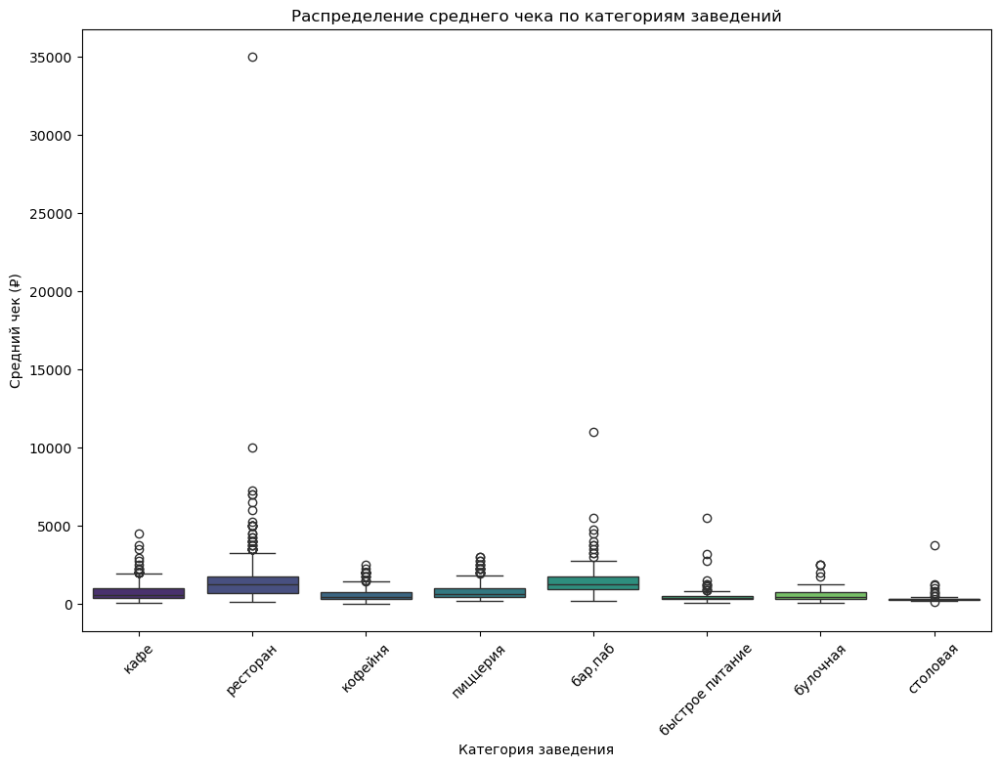

In [85]:
# Создаем сводную таблицу, где строки — это округа, столбцы — категории, значения — медиана среднего чека
district_category_info = moscow_places.pivot_table(
    index='district', 
    columns='category', 
    values='middle_avg_bill',
    aggfunc='median'
).reset_index()

# Выводим результат
print('Медианы среднего чека по категориям и округам:')
display(district_category_info)

# Построим диаграмму размаха среднего чека по категориям
plt.figure(figsize=(12, 8))
sns.boxplot(data=moscow_places, x='category', y='middle_avg_bill', palette='viridis', hue='category')

plt.title('Распределение среднего чека по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Средний чек (₽)')

plt.xticks(rotation=45)
plt.show()

Увеличим масштаб.

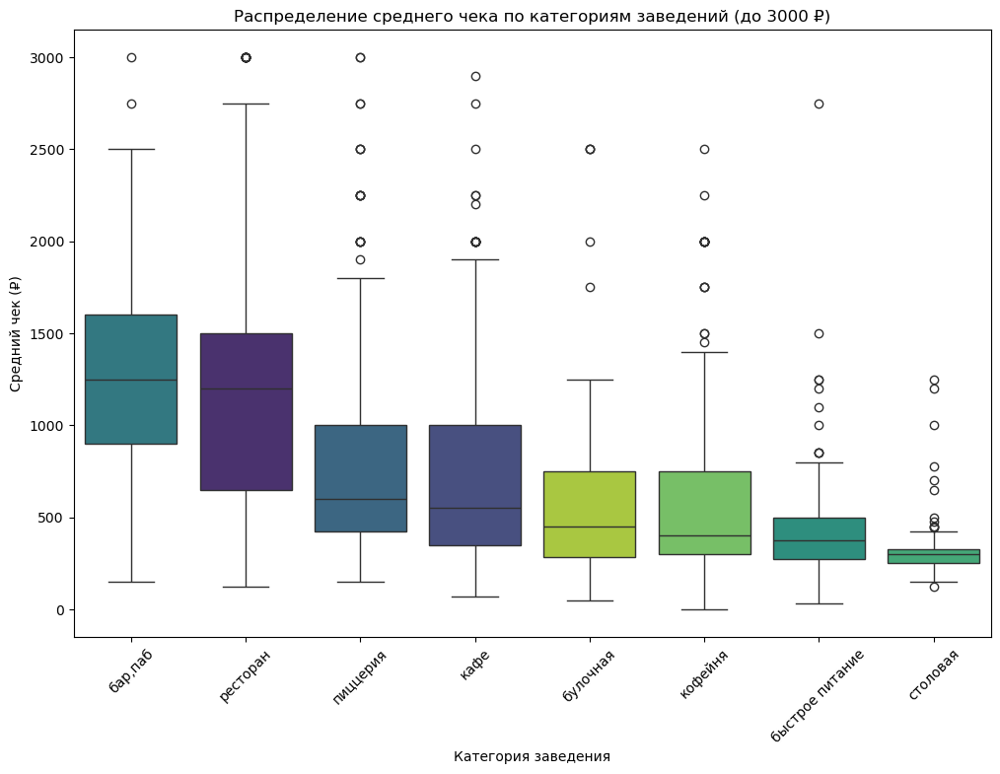

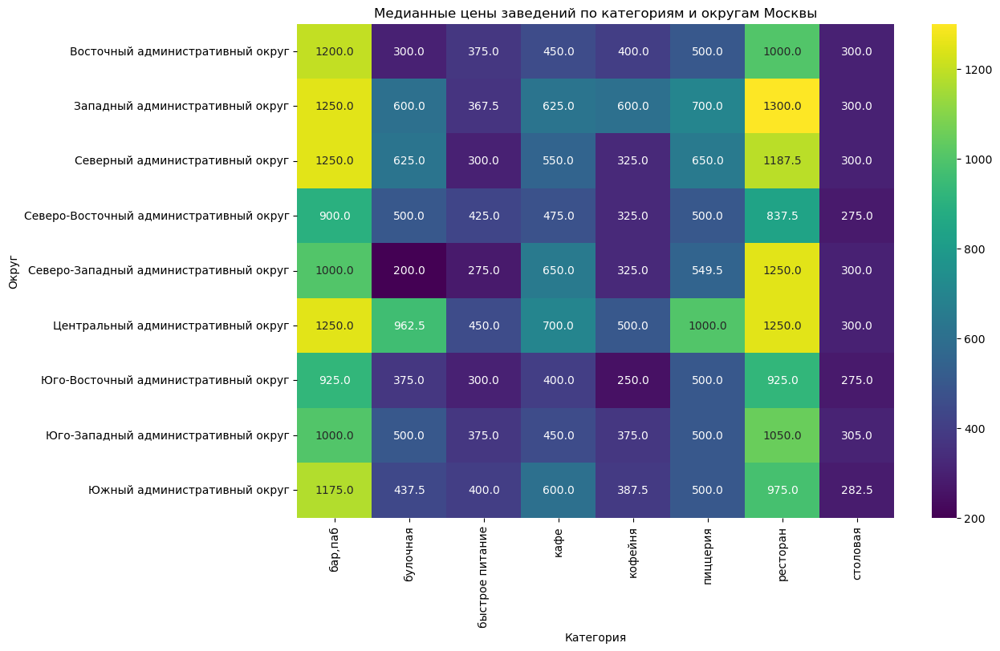

In [87]:
# Рассчитываем медианы среднего чека для каждой категории и сортируем по убыванию
sorted_categories = moscow_places.groupby('category')['middle_avg_bill'].median().sort_values(ascending=False).index

# Построим диаграмму размаха для среднего чека по категориям, ограничив значение до 3000 ₽
plt.figure(figsize=(12, 8))
sns.boxplot(data=moscow_places[moscow_places['middle_avg_bill'] <= 3000], 
            x='category', y='middle_avg_bill', order=sorted_categories, palette='viridis', hue='category')

plt.title('Распределение среднего чека по категориям заведений (до 3000 ₽)')
plt.xlabel('Категория заведения')
plt.ylabel('Средний чек (₽)')

plt.xticks(rotation=45)
plt.show()

# Строим тпловую диаграмму
plt.figure(figsize=(12, 8))
sns.heatmap(district_category_info.set_index('district'), annot=True, cmap='viridis', fmt=".1f")

plt.title('Медианные цены заведений по категориям и округам Москвы')
plt.xlabel('Категория')
plt.ylabel('Округ')

plt.show()

Выводы:
- Высокий чек наблюдается в ресторанах и барах/пабах. У данных категорий заведений средний чек выше в 2-3 раза, чем у остальных категорий. Самый высокий средний чек в ресторанах в Западном округе.
- Средний чек у пиццерий, кафе, булочных и кофеен.
- Низкий чек у столовых и заведений быстрого питания. У этих заведений также наблюдается маленький разброс по ценам.
- Зависимость от округа: в центре и на западе Москвы находятся много дорогих заведений, там много баров/пабов и ресторанов.

**3.14. Заведения с низкими рейтингами.**

Количество заведений с рейтингом ниже 3.5 по категориям:


,category,count,share
0,кафе,213,49.19
1,ресторан,66,15.24
2,быстрое питание,65,15.01
3,кофейня,45,10.39
4,"бар,паб",15,3.46
5,столовая,11,2.54
6,пиццерия,10,2.31
7,булочная,8,1.85


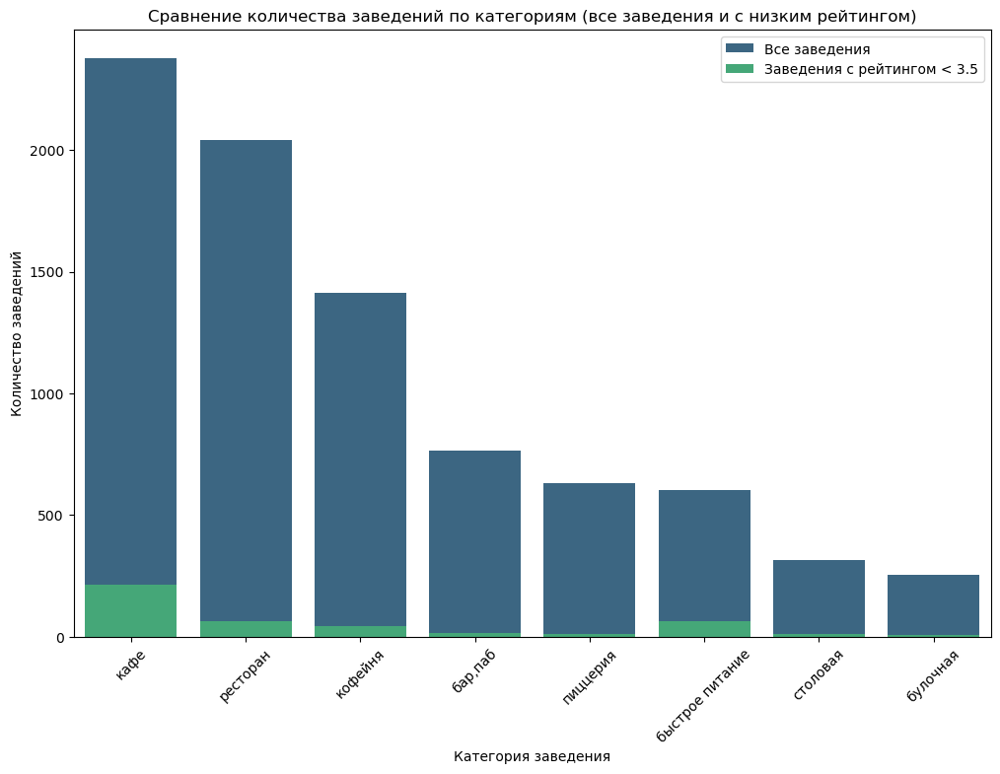

In [90]:
# Фильтруем заведения с рейтингом ниже 3.5
low_rating_places = moscow_places[moscow_places['rating'] < 3.5]

low_rating_info = low_rating_places['category'].value_counts().reset_index(name='count').rename(columns={'index': 'category'})
low_rating_info['share'] = (low_rating_info['count'] / low_rating_info['count'].sum() * 100).round(2)

# Выводим результат
print('Количество заведений с рейтингом ниже 3.5 по категориям:')
display(low_rating_info)

# Общее количество заведений по категориям
total_category_info = category_info

# Объединяем данные для сравнения
comparison_df = total_category_info.merge(low_rating_info, on='category', how='left', suffixes=('_total', '_low_rating')).fillna(0)

# Строим 2 распределения по категориям для сравнения
plt.figure(figsize=(12, 8))

palette = sns.color_palette("viridis", 2)

sns.barplot(x='category', y='count_total', data=comparison_df, color=palette[0], label='Все заведения')
sns.barplot(x='category', y='count_low_rating', data=comparison_df, color=palette[1], label='Заведения с рейтингом < 3.5')

plt.title('Сравнение количества заведений по категориям (все заведения и с низким рейтингом)')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.legend()
plt.show()

Выводы:
- Почти половина заведений с низким рейтингом - это кафе. Они составляют 49.19% всех заведений с оценкой ниже 3.5. 
- Заведения быстрого питания также часто имеют низкие оценки. Они составляют 15.01% всех заведений с низким рейтингом, хотя их доля среди всех заведений составляет только 7.18%. 

Выводы:
1. Сводный анализ по категориям заведений: 
    - Количество: в Москве преобладают кафе (28.29% от общего числа заведений) и рестораны (24.30%). Кофейни занимают третье место (16.81%). Булочные и столовые имеют наменьшее присутствие.
    - Посадочные места: рестораны, бары и кофейни обладают наибольшей вместимостью. Наименее вместительные — пиццерии и булочные.
    - Средний чек: высокий средний чек - в ресторанах и барах/пабах.  У данных категорий заведений средний чек выше в 2-3 раза, чем у остальных категорий. Низкий чек у столовых и заведений быстрого питания.
    - Рейтинг: У пабов и баров самый высокий рейтинг - 4.4. У кафе и кафе быстрого питания самый низкий рейтинг - 4.1.



2. Сводный анализ по месторасположению заведений: 
    - Количество: Центральный округ лидирует по общему количеству заведений, а также по количеству ресторанов, кафе, кофеен и пабов/баров. Значительная часть ресторанов и пабов/баров сконцентрирована в центре.  Основная улица с высоким количеством заведений: проспект Мира. В остальных округах популярны кафе, кофейни и рестораны, но в меньших количествах по сравнению с Центральным округом.
    - Средний чек: Центральный и Западный округа имеют самый высокий средний чек: 1000 рублей. Это связано с тем, что в этих районах много дорогих заведений: пабов, баров и ресторанов. Северо-Восточный, Южный и Юго-Восточный округа имеют самый низкий средний чек: 500 и 450 рублей.
    - Рейтинг: Центральный округ имеет самый высокий средний рейтинг (4.38). Северный (4.24) и Северо-Западный округа (4.21) также показывают хорошие средние рейтинги. Юго-Восточный округ имеет самый низкий средний рейтинг (4.10).




3. Сетевые и несетевые заведения:
    - Несетевые заведения составляют большинство 61.88% от общего количества заведений.
    - Сетевые заведения составляют 38.1% рынка. Популярные форматы сетей: булочные, пиццерии и кофейни. Лидером среди сетей является "Шоколадница" (120 точек).

## Исследование кофеен

**4.1. Количество кофеен.**

In [95]:
# Подсчитаем количество кофеен в датасете
coffee_shops = moscow_places[moscow_places['category'] == 'кофейня']
print('Количество кофеен:', coffee_shops.shape[0])

Количество кофеен: 1413


**4.2. Количество кофеен по округам Москвы.**

'Количество кофеен по округам Москвы:'

,district,total_count,coffee_count,coffee_share_of_total,coffee_share
5,Центральный административный округ,2242,428,19.09,30.29
2,Северный административный округ,898,193,21.49,13.66
3,Северо-Восточный административный округ,890,159,17.87,11.25
1,Западный административный округ,850,150,17.65,10.62
8,Южный административный округ,892,131,14.69,9.27
0,Восточный административный округ,798,105,13.16,7.43
7,Юго-Западный административный округ,709,96,13.54,6.79
6,Юго-Восточный административный округ,714,89,12.46,6.30
4,Северо-Западный административный округ,409,62,15.16,4.39


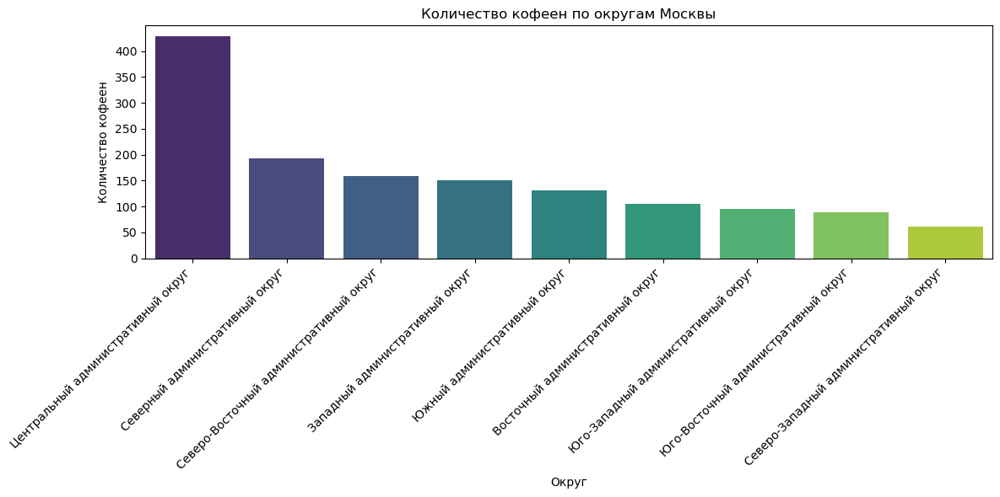

In [97]:
# Подсчитаем количество кофеен по округам Москвы
coffee_shops_info = moscow_places.groupby('district').size().reset_index(name='total_count')
coffee_shops_counts = coffee_shops.groupby('district').size().reset_index(name='coffee_count')
coffee_shops_info = coffee_shops_info.merge(coffee_shops_counts, on='district', how='left')
coffee_shops_info['coffee_share_of_total'] = (coffee_shops_info['coffee_count'] / coffee_shops_info['total_count'] * 100).round(2)
coffee_shops_info['coffee_share'] = (coffee_shops_info['coffee_count'] / coffee_shops_info['coffee_count'].sum() * 100).round(2)
coffee_shops_info = coffee_shops_info.sort_values(by='coffee_count', ascending=False)

display('Количество кофеен по округам Москвы:', coffee_shops_info)

# Строим график
plt.figure(figsize=(12, 6))
sns.barplot(x='district', y='coffee_count', data=coffee_shops_info, palette='viridis', hue='district')

plt.title('Количество кофеен по округам Москвы')
plt.xlabel('Округ')
plt.ylabel('Количество кофеен')

plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

Выводы:
- Всего 1413 кофеен.
- Центральный административный округ: наибольшее количество кофеен (428), что составляет 30.29% всех кофеен Москвы и 19.09% всех заведений округа.
- Северный, Северо-Восточный и Западный округа: привлекательны для открытия новых кофеен благодаря высокой доле кофеен среди всех заведений: 21.49%, 17.87% и 17.65% соответственно.

**4.3. Круглосуточные кофейни.**

'Количество круглосуточных кофеен по округам Москвы:'

,district,total_count,coffee_count,coffee_share_of_total,coffee_share,24_7_coffee_count,24_7_coffee_share
5,Центральный административный округ,2242,428,19.09,30.29,26,6.07
2,Северный административный округ,898,193,21.49,13.66,5,2.59
3,Северо-Восточный административный округ,890,159,17.87,11.25,3,1.89
1,Западный административный округ,850,150,17.65,10.62,9,6.00
8,Южный административный округ,892,131,14.69,9.27,1,0.76
0,Восточный административный округ,798,105,13.16,7.43,5,4.76
7,Юго-Западный административный округ,709,96,13.54,6.79,7,7.29
6,Юго-Восточный административный округ,714,89,12.46,6.30,1,1.12
4,Северо-Западный административный округ,409,62,15.16,4.39,2,3.23


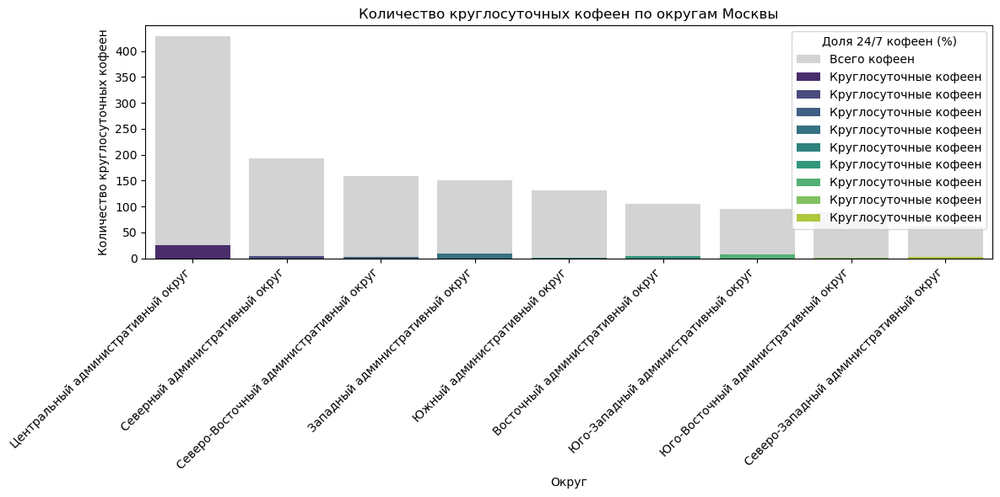

In [100]:
# Подсчитаем количество круглосуточных кофеен по округам Москвы
coffee_shops_info['24_7_coffee_count'] = coffee_shops_info['district'].apply(
    lambda district: coffee_shops[(coffee_shops['district'] == district) & (coffee_shops['is_24_7'])].shape[0]
)
coffee_shops_info['24_7_coffee_share'] = (coffee_shops_info['24_7_coffee_count'] / coffee_shops_info['coffee_count'] * 100).round(2)

display('Количество круглосуточных кофеен по округам Москвы:', coffee_shops_info)

# Строим график
plt.figure(figsize=(12, 6))
sns.barplot(x='district', y='coffee_count', data=coffee_shops_info, color='lightgrey', label='Всего кофеен')
sns.barplot(x='district', y='24_7_coffee_count', data=coffee_shops_info, palette='viridis', hue='district', label='Круглосуточные кофеен')

plt.title('Количество круглосуточных кофеен по округам Москвы')
plt.xlabel('Округ')
plt.ylabel('Количество круглосуточных кофеен')

plt.xticks(rotation=45, ha='right')
plt.legend(title='Доля 24/7 кофеен (%)', loc='upper right')

plt.tight_layout()
plt.show()

Выводы:
- Юго-Западный округ — высокий процент круглосуточных кофеен среди всех кофеен (7.3%).
- Центральный и Западный округа — имеют значительное количество круглосуточных кофеен (6%).
- Восточный округ - 4.76%.
- Остальные округа: низкое количество круглосуточных заведений.

**4.4. Рейтинги кофеен.**

In [103]:
# Подсчитаем средние рейтинги кофеен и их распределение по округам Москвы
mean_ratings = coffee_shops.groupby('district')['rating'].mean().reset_index()
mean_ratings.rename(columns={'rating': 'mean_rating'}, inplace=True)
coffee_shops_info = coffee_shops_info.merge(mean_ratings, on='district', how='left')
coffee_shops_info['mean_rating'] = coffee_shops_info['mean_rating'].round(2)

display('Средние рейтинги кофеен по округам Москвы:', coffee_shops_info)

# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
folium.Choropleth(
    geo_data=geo_json,
    data=coffee_shops_info,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средние рейтинги кофеен по округам Москвы',
).add_to(m)

# Выводим карту
m

'Средние рейтинги кофеен по округам Москвы:'

,district,total_count,coffee_count,coffee_share_of_total,coffee_share,24_7_coffee_count,24_7_coffee_share,mean_rating
0,Центральный административный округ,2242,428,19.09,30.29,26,6.07,4.34
1,Северный административный округ,898,193,21.49,13.66,5,2.59,4.29
2,Северо-Восточный административный округ,890,159,17.87,11.25,3,1.89,4.22
3,Западный административный округ,850,150,17.65,10.62,9,6.00,4.20
4,Южный административный округ,892,131,14.69,9.27,1,0.76,4.23
5,Восточный административный округ,798,105,13.16,7.43,5,4.76,4.28
6,Юго-Западный административный округ,709,96,13.54,6.79,7,7.29,4.28
7,Юго-Восточный административный округ,714,89,12.46,6.30,1,1.12,4.23
8,Северо-Западный административный округ,409,62,15.16,4.39,2,3.23,4.33


Выводы:
- ЦАО и Северо-Западный округ имеют наивысший средний рейтинг (4.34 и 4.33 соответственно).
- Северный, Восточный и Юго-Западный округа также имеют высокие средние рейтинги (4.29, 4.28 и 4.28 соответственно).
- Южный (4.23), Юго-Восточный (4.23), Северо-Восточный (4.22) и Западный округ (4.20): средний рейтинг немного ниже.

**4.5. Стоимость чашки капучино.**

In [106]:
# Подсчитаем  стоимость чашки капучино по округам Москвы
avg_cappuccino_prices = coffee_shops.groupby('district')['middle_coffee_cup'].median().reset_index(name='avg_cappuccino_price').sort_values(by='avg_cappuccino_price', ascending=False)
avg_cappuccino_prices

display('Стоимость чашки капучино в кофейнях по округам Москвы:', avg_cappuccino_prices)

# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
folium.Choropleth(
    geo_data=geo_json,
    data=avg_cappuccino_prices,
    columns=['district', 'avg_cappuccino_price'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Стоимость чашки капучино в кофейнях по округам Москвы',
).add_to(m)

# Выводим карту
m

'Стоимость чашки капучино в кофейнях по округам Москвы:'

,district,avg_cappuccino_price
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Выводы:
- Самые высокие медианные цены на капучино в центре (190 рублей), Юго-Западном (198 рублей) и Западном (189 рублей) округах.
- Самые низкие медианные цены на капучино в Восточном (135 рублей) и Юго-Восточном (147.5 рублей) округах.

Рекомендации:
Привлекательные районы для открытия новых кофеен:
1. Центральный административный округ:
    - Высокая конкуренция и востребованность: в ЦАО расположено 2242 заведения, из которых 428 — это кофейни. Это составляет 30.29% всех кофеен Москвы, что указывает на высокий спрос и сильную конкуренцию.
    - Платежеспособная аудитория: в ЦАО много деловых и обеспеченных людей, туристов. Средняя цена чашки капучино составляет 190 рублей.
    - Круглосуточный формат как конкурентное преимущество: в ЦАО 26 круглосуточных кофеен (6.07% от всех кофеен в центре), что показывает популярность круглосуточных заведений в округе.

2.  Юго-Западный административный округ:
    - Высокая средняя цена капучино: средняя цена капучино здесь составляет 198 рублей, что является самым высоким показателем среди всех округов. 
    - Высокий процент круглосуточных кофеен: 7.29% от всех кофеен округа работают круглосуточно, что указывает на стабильный спрос круглосуточного формата.
    - Рекомендации: здесь стоит открывать кофейню высокого уровня с качественным кофе и уникальными предложениями. Круглосуточный формат может быть интересен для студентов и активной аудитории.

3. Северный административный округ:
    - Высокий процент кофеен среди всех заведений: доля кофеен составляет 21.49%, что указывает на высокий спрос на этот тип заведений.
    - Средняя цена капучино — 159 рублей.
    - Рекомендации: открытие кофейни среднего уровня с акцентом на удобство и качество. 

## Презентация

Презентация:
- гугл диск: https://docs.google.com/presentation/d/1jkaDzvbiF2PVxnb-t9MeJESjXf010G1rTZD49qbHQe8/edit?usp=sharing
- пдф: https://drive.google.com/file/d/18pS7UcGOMuxTmzuxgU67Sluy4FUtaOtX/view?usp=sharing

## Выводы

I. ЗАГРУЗКА И ЗНАКОМСТВО С ДАННЫМИ
1. Датасет *moscow_places* содержит информацию о 8406 заведениях. 
2. У каждого заведения 14 характеристик (столбцов), которые представлены в виде разных типов данных:
    - Строковые данные (object):
        - name: название заведения
        - category: категория заведения
        - address: адрес заведения
        - district: район города
        - hours: время работы
        - price: ценовая категория
        - avg_bill: средний счет (в виде строки)
    - Вещественные числа (float64):
        - lat: широта (географические координаты)
        - lng: долгота (географические координаты)
        - rating: рейтинг заведения
        - middle_avg_bill: средний чек (в виде числа)
        - middle_coffee_cup: стоимость чашки кофе
        - seats: количество мест
    - Целые числа (int64):
        - chain: является ли заведение сетевым (0 — нет, 1 — да)

3. Большинство данных присутствуют, но есть пропуски в столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, и seats.



II. ПРЕДОБРАБОТКА ДАННЫХ
1. Обработка дубликатов:
    - явных дубликатов: нет;
    - неявных дубликатов: обнаружены и удалены 4 строки.
Новый размер датасета 'moscow_places': (8402, 16). 


2. Обработка пропусков:
    - `middle_coffee_cup` (93.64% пропусков) и `middle_av_bill` (62.54% пропусков) - все ок, значения зависят от столбца `avg_bill` и отсутствуют только там, где их не должно быть по смыслу.
    - `price` (60.56% пропусков) - заполнила пропуски медианными значениями `middle_av_bill` для каждой категории заведений.
    - `avg_bill` (54.58% пропусков), `seats` (42.97% пропусков), `hours` (6.38% пропусков) - заполнила пропуски заглушками: для `avg_bill` и `hours` строкой "не указано", для `seats` - np.nan.
 
 
3. Добавление новых столбцов для более полного анализа:
- столбец street с названиями улиц из столбца с адресом.
- столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    - True — если заведение работает ежедневно и круглосуточно;
    - False — в противоположном случае.
    


III. АНАЛИЗ ДАННЫХ

1. Категории заведений. В датасете 8 категорий: кафе, ресторан, кофейня, бар,паб, пиццерия, быстрое питание, столовая, булочная.

2. Количество заведений по категориям:
    - Кафе (28.29%) и рестораны (24.30%) являются самыми распространенными категориями заведений.
    - Кофейни занимают третье место, составляя 16.81% заведений.
    - Бары и пабы составляют - 9.10% от общего числа заведений, пиццерии - 7.53% и быстрое питание - 7.17%.
    - Столовые (3.75%) и булочные (3.05%) - наименее популярные категории заведений.

3. Количество посадочных мест по категориям:
    - Рестораны, бары/пабы и кофейни имеют больше посадочных мест, чем остальные заведения. При этом наименьший разброс в количестве посадочных мест.
    - Столовые, заведения быстрого питания, кафе имеют среднюю вместимость.
    - Пиццерии и булочные имеют наименьшую вместимость.

4. Сетевые и несетевые заведения:
    - Несетевые заведения составляют большинство 61.88% от общего количества заведений.
    - Сетевые заведения составляют - 38.1%.

5. Категории сетевых заведений:
    - Сетевыми заведениями чаще являются булочные (61.33% от общего числа булочных), пиццерии (52.13% от общего числа пиццерий) и кофейни (50.96% от общего числа кофеен).


6. Топ-15 популярных сетей по количеству заведений:
    - Наиболее крупная сеть: "Шоколадница" со 120 заведениями. Она выделяется в списке сетей с заметным отрывом.
    - Форматы популярных заведений:
        - Кофейни: Шоколадница (119), One Price Coffee (71), Cofix (65), КОФЕПОРТ (42), CofeFest (31), и Кофемания (22).
        - Пиццерии: Домино'с Пицца (76) и Додо Пицца (74).
        - Рестораны быстрого обслуживания: Яндекс Лавка (69), Prime (49), и Теремок (36). Это указывает на высокий интерес к заведениям быстрого обслуживания, плюс если есть доставка.
        - Кафе: Кулинарная лавка братьев Караваевых (39), Чайхана (26), и Drive Café (24).

7. Количество заведений каждой категории по округам Москвы:
    - Центральный округ лидирует по общему количеству заведений, а также по количеству ресторанов, кафе, кофеен и пабов/баров. Значительная часть ресторанов и пабов/баров сконцентрирована в центре.
    - В остальных округах популярны кафе, кофейни и рестораны, но в меньших количествах по сравнению с Центральным округом.

8. Средние рейтинги по категориям:
    - У пабов и баров самый высокий рейтинг - 4.4.
    - У булочных, кофеен, пиццерий и ресторанов - рейтинг 4.3. 
    - У столовых - рейтинг 4.2.
    - У кафе и кафе быстрого питания самый низкий рейтинг - 4.1.


9. Средние рейтинги заведений по округам Москвы:
    - Центральный округ имеет самый высокий средний рейтинг (4.38).
    - Северный (4.24) и Северо-Западный административные округа (4.21) также показывают хорошие средние рейтинги.
    - Юго-Восточный округ имеет самый низкий средний рейтинг (4.10).
    - У остальных округов средний рейтинг колеблется от 4.15 до 4.18.


10. Топ-15 улиц по количеству заведений:
    - Основная улица с высоким количеством заведений: проспект Мира.
    - Кафе, рестораны и кофейни являются самыми многочисленными категориями на большинстве улиц. Столовые и булочные имеют меньшую популярность.
    - Специфичные улицы: на МКАД в основном находятся кафе и заведения быстрого питания, на Пятницкой улице - рестораны.


11. Улицы с одним заведением - это в основном маленькие улицы, переулки и проезды.


12. Медианные цены заведений по округам Москвы:
    - Центральный и Западный административные округа имеют самые высокие медианные значения среднего чека: 1000 рублей.
    - Северо-Восточный, Южный и Юго-Восточный округа имеют самые низкие медианные значения среднего чека: 500 и 450 рублей.
    - У остальных округов медианные значения среднего чека колеблются от 575 до 700 рублей.


13. Медианные цены заведений по категориям:
    - Высокий чек наблюдается в ресторанах и барах/пабах.  У данных категорий заведений средний чек выше в 2-3 раза, чем у остальных категорий.
    - Средний чек у пиццерий, кафе, булочных и кофеен.
    - Низкий чек у столовых и заведений быстрого питания. У этих заведений также наблюдается маленький разброс по ценам.
    - Зависимость от округа: в центре и на западе Москвы находятся много дорогих заведений, там много баров/пабов и ресторанов.


14. Заведения с низкими рейтингами:
    - Почти половина заведений с низким рейтингом - это кафе. Они составляют 49.19% всех заведений с оценкой ниже 3.5.
    - Заведения быстрого питания также часто имеют низкие оценки. Они составляют 15.01% всех заведений с низким рейтингом, хотя их доля среди всех заведений составляет только 7.18%.



IV. ИССЛЕДОВАНИЕ КОФЕЕН
1. Количество кофеен по округам Москвы.
    - Всего 1413 кофеен.
    - Центральный административный округ: наибольшее количество кофеен (428), что составляет 30.29% всех кофеен Москвы и 19.09% всех заведений округа.
    - Северный, Северо-Восточный и Западный округа: привлекательны для открытия новых кофеен благодаря высокой доле кофеен среди всех заведений: 21.49%, 17.87% и 17.65% соответственно.

2. Круглосуточные кофейни.
    - Юго-Западный округ — высокий процент круглосуточных кофеен среди всех кофеен (7.3%).
    - Центральный и Западный округа — имеют значительное количество круглосуточных кофеен (6%).
    - Восточный округ - 4.76%.
    - Остальные округа: низкое количество круглосуточных заведений.

3. Рейтинги кофеен
    - ЦАО и Северо-Западный округ имеют наивысший средний рейтинг (4.34 и 4.33 соответственно).
    - Северный, Восточный и Юго-Западный округа также имеют высокие средние рейтинги (4.29, 4.28 и 4.28 соответственно).
    - Южный (4.23), Юго-Восточный (4.23), Северо-Восточный (4.22) и Западный округ (4.20): средний рейтинг немного ниже.


4. Стоимость чашки капучино:
    - Самые высокие медианные цены на капучино в центре (190 рублей), Юго-Западном (198 рублей) и Западном (189 рублей) округах.
    - Самые низкие медианные цены на капучино в Восточном (135 рублей) и Юго-Восточном (147.5 рублей) округах.


5. Рекомендации:


Привлекательные районы для открытия новых кофеен:
1. Центральный административный округ:
    - Высокая конкуренция и востребованность: в ЦАО расположено 2242 заведения, из которых 428 — это кофейни. Это составляет 30.29% всех кофеен Москвы, что указывает на высокий спрос и сильную конкуренцию.
    - Платежеспособная аудитория: в ЦАО много деловых и обеспеченных людей, туристов. Средняя цена чашки капучино составляет 190 рублей.
    - Круглосуточный формат как конкурентное преимущество: в ЦАО 26 круглосуточных кофеен (6.07% от всех кофеен в центре), что показывает популярность круглосуточных заведений в округе.

2.  Юго-Западный административный округ:
    - Высокая средняя цена капучино: средняя цена капучино здесь составляет 198 рублей, что является самым высоким показателем среди всех округов. 
    - Высокий процент круглосуточных кофеен: 7.29% от всех кофеен округа работают круглосуточно, что указывает на стабильный спрос круглосуточного формата.
    - Рекомендации: здесь стоит открывать кофейню высокого уровня с качественным кофе и уникальными предложениями. Круглосуточный формат может быть интересен для студентов и активной аудитории.

3. Северный административный округ:
    - Высокий процент кофеен среди всех заведений: доля кофеен составляет 21.49%, что указывает на высокий спрос на этот тип заведений.
    - Средняя цена капучино — 159 рублей.
    - Рекомендации: открытие кофейни среднего уровня с акцентом на удобство и качество. 



V. ПРЕЗЕНТАЦИЯ